<a href="https://colab.research.google.com/github/MannCodes14/MannCodes14/blob/main/DogsBreed3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle

In [ ]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mann149","key":"2c55c06f73663186e6a090bde327263a"}'}

In [ ]:
!mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
!mv kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle competitions download -c dog-breed-identification

dog-breed-identification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip dog-breed-identification.zip


Archive:  dog-breed-identification.zip
replace labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!pip install tf_keras

ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 377, in run
    requirement_set = resolver.resolve(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/resolution/resolvelib/resolver.py", line 95, in resolve
    result = self._result = resolver.resolve(
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 546, in resolve
    state = resolution.resolve(requirements, max_rounds=max_rounds)
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/resolvelib/resolvers.py", line 427, in resolve
    failure_causes = self._attempt_to_pin_criterion(name)

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print(tf.__version__)
print(hub.__version__)

2.17.1
0.16.1


In [ ]:
# Check out the labels of our data
import pandas as pd
labels_csv= pd.read_csv('/content/labels.csv')

print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


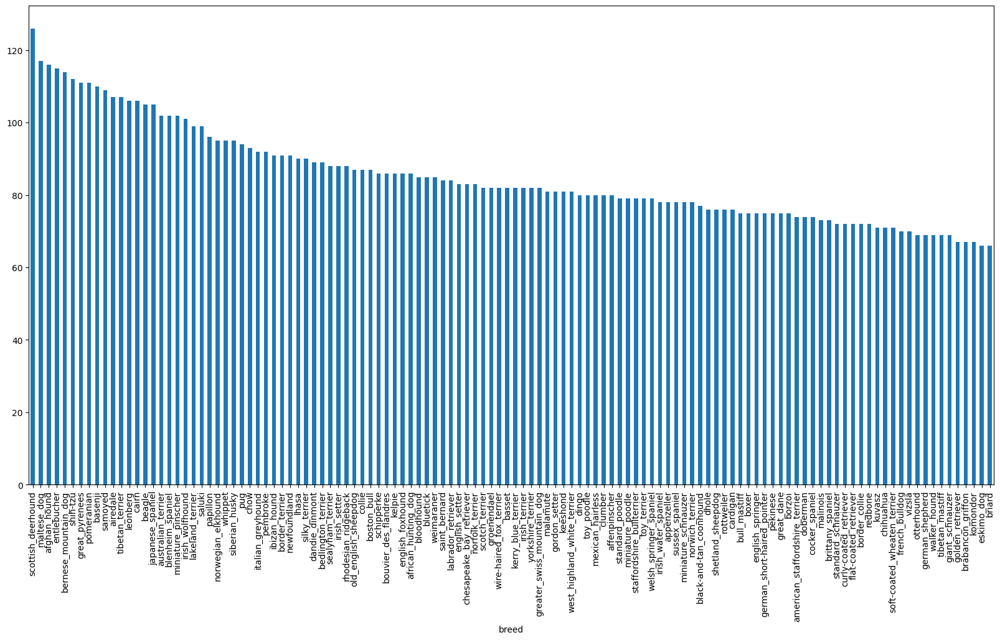

In [ ]:


# how many iamge
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));



In [ ]:
labels_csv['breed'].value_counts().median()

82.0

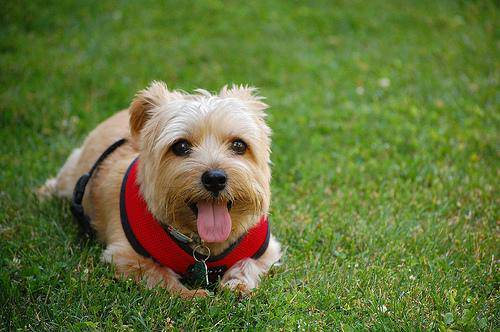

In [ ]:
from IPython.display import Image
Image('/content/train/0075dc49dab4024d12fafe67074d8a81.jpg')

In [ ]:
# Create path name from images ID's
filenames= ["/content/train/"+fname + ".jpg" for fname in labels_csv['id']]
# Check the first 10
filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image file

import os
if len(os.listdir("/content/train/"))== len(filenames):
  print("Filename match actual amount of files!!! Proceed. ")
else:
  print("Filename NOT match actual amount of files, Check the target directory ")

Filename match actual amount of files!!! Proceed. 


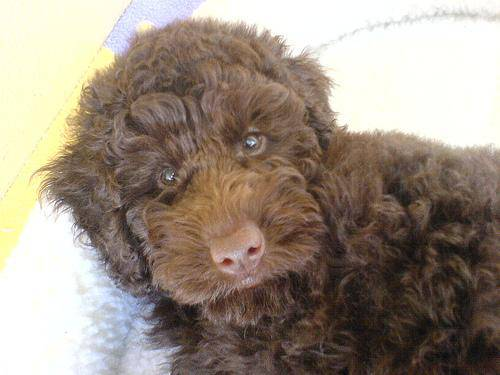

In [ ]:
# one more check
Image(filenames[404])

In [ ]:
import numpy as np

labels= labels_csv['breed'].to_numpy()
#labels= np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels)== len(filenames):
  print("Number of labeles matches number of filenames!")
else:
  print("NUmber of Labels doesn't match number of filename, check data Dirs")

Number of labeles matches number of filenames!


In [ ]:
# Find the Unique label values
unique_breeds= np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array

boolean_labels= [label== unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into int
print(labels[0]) # Original label
print(np.where(unique_breeds==labels[0])) # index of the labels occurs

print(boolean_labels[0].argmax()) # index where label occurs in boolean array

print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Setup X & Y Variables

x= filenames
y= boolean_labels

In [ ]:
# Set number of image to use for experminting

NUM_IMAGES=1000 # @param{type:'slider',min:1000,max:10000,step:100}

In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGES

X_train, X_val , Y_tarin, Y_val = train_test_split(x[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)

len(X_train) , len(Y_tarin) , len(X_val) , len(Y_val)

(800, 800, 200, 200)

In [ ]:
# let's have a geez at the training data

X_train[:3] , Y_tarin[:3]

(['/content/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False,

In [ ]:
# Convert an image into Numpy Array

from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image into Tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE= 224

# Create a function for preprocessing images

def process_image(image_path, image_size=IMG_SIZE):
  """
  Takes an images filepath and turns the image into a Tensor.
  """
  # Read an image file
  image= tf.io.read_file(image_path)
  # Trun the image into numerical Tensor with 3 color channels (red ,green,blue)
  image= tf.image.decode_jpeg(image,channels=3)
  # Convert the color channel values from 0-255 to 0-1 values (Normalization)
  image= tf.image.convert_image_dtype(image,tf.float32)
  # Rsize the image to our desired value (244,244)
  image= tf.image.resize(image,size=[image_size,image_size])
  return image

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Take an image file path name and the assoicated label,
  processes the image and returns a tuble of image label
  """
  image= process_image(image_path)
  return image , label

In [ ]:
(process_image(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size , 32 is a good start

BATCH_SIZE= 32

# Lets Create a function to turn data into batches

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of images (x) and label (y) paris.
  Shuffle the data if it's training data but doesn't shuffle it's validation data.
  Also accespts test data as input (no label) .
  """
  # If the data is test data set, we Probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data= tf.data.Dataset.from_tensor_slices(tf.constant(x))  # only filepath (no labels)
    data_batch= data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating valid data batches.....")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x), # file path
                                             tf.constant(y)))  # labels

    data_batch= data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating data batche......")
    # Turn file path and labels into Tensors
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x), # file path
                                             tf.constant(y)))  # labels
    # Shuffling the pathnames and labels before mapping image processor function is faster than shuffing images
    data= data.shuffle(buffer_size=len(x))
    # Create (image,labels) tubles (this also turns the image path into a pre-processd image)
    data= data.map(get_image_label)
    # Turn the training data into batches
    data_batch= data.batch(batch_size)
    return data_batch

In [ ]:
# Create training data  and validation data batches

train_data= create_data_batches(X_train,Y_tarin)
val_data= create_data_batches(X_val,Y_val,valid_data=True)

Creating data batche......
Creating valid data batches.....


In [ ]:
# Check out the different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images,labels):
  """
  Displays a plot of 25 images and there lables from a data batch

  """
  # Setup a figure
  plt.figure(figsize=(10,10))
  # Loop thorw 25 (for displaying 25 images)
  for i in range(25):
    # Create a subplots
    ax=plt.subplot(5,5,i+1)
    # Display an images
    plt.imshow(images[i])
    # Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    # Trun the grid line off
    plt.axis('off')

In [ ]:
train_images, train_labels= next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.50953376, 0.6283628 , 0.7699237 ],
          [0.7407939 , 0.8362589 , 0.9173905 ],
          [0.565409  , 0.61991066, 0.643625  ],
          ...,
          [0.8859254 , 0.97232366, 0.95106137],
          [0.8578692 , 0.9399729 , 0.9459617 ],
          [0.8876426 , 0.97416997, 0.9879996 ]],
 
         [[0.6585053 , 0.7500421 , 0.8411215 ],
          [0.29575652, 0.36791164, 0.4503717 ],
          [0.5621985 , 0.60363233, 0.6173911 ],
          ...,
          [0.8928307 , 0.9672092 , 0.9515667 ],
          [0.9064481 , 0.9650833 , 0.9780014 ],
          [0.7855478 , 0.8393308 , 0.8613276 ]],
 
         [[0.6459047 , 0.7044271 , 0.8057326 ],
          [0.7966159 , 0.8405043 , 0.89730567],
          [0.84946096, 0.86925566, 0.87932795],
          ...,
          [0.9134395 , 0.9734973 , 0.96173257],
          [0.9379841 , 0.9669021 , 0.9715643 ],
          [0.7726158 , 0.7971606 , 0.81408113]],
 
         ...,
 
         [[0.49814808, 0.46601507, 0.28790423],
          [0.64894

In [ ]:
len(train_images), len(train_labels)

(32, 32)

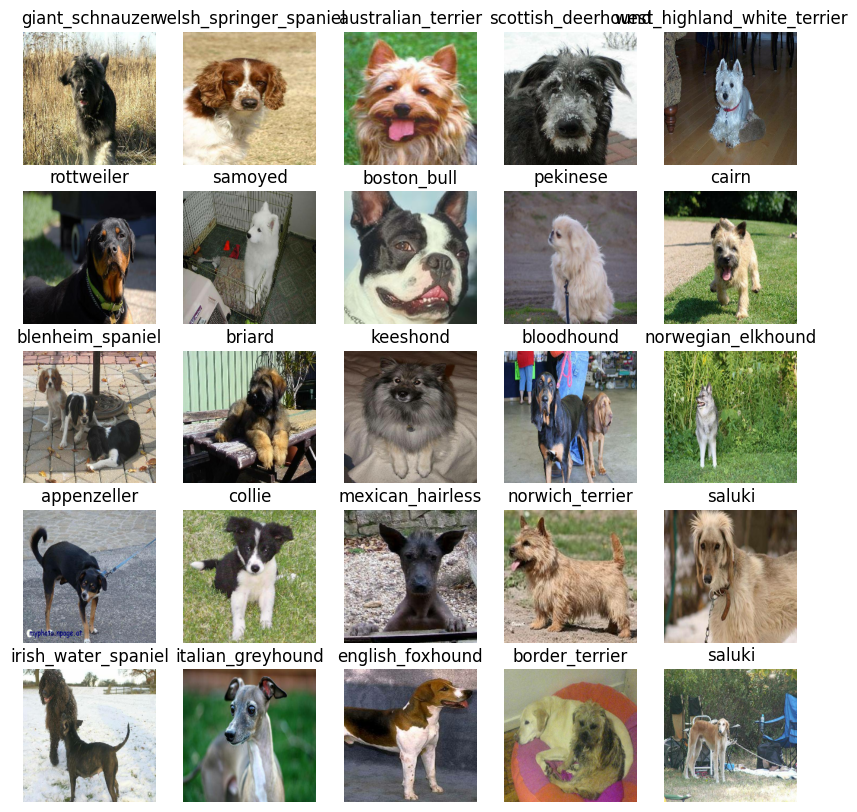

In [ ]:
show_25_images(train_images,train_labels)

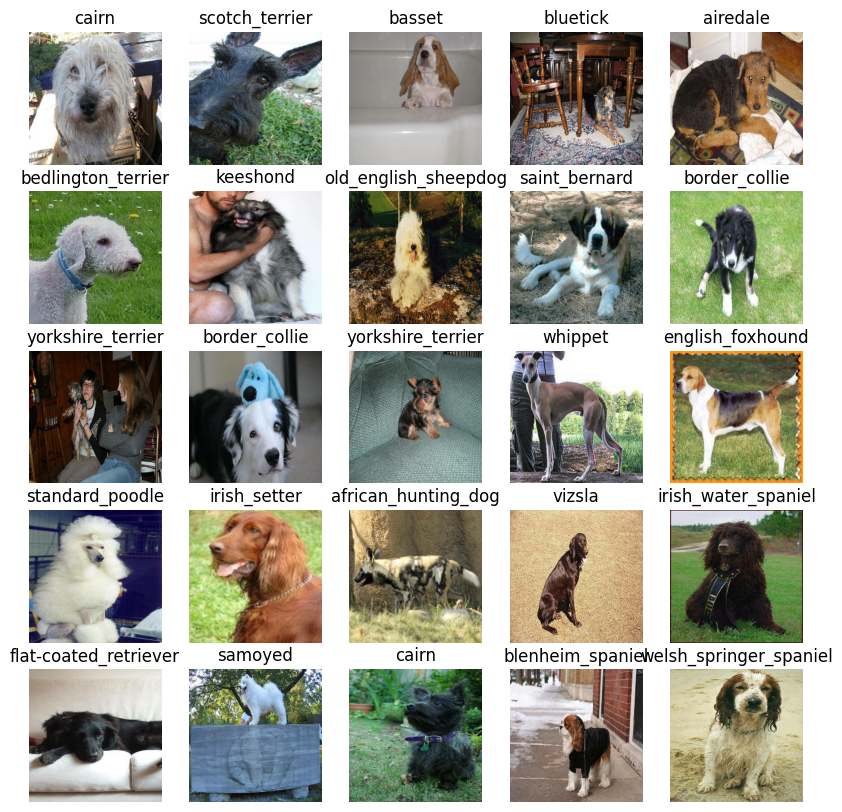

In [ ]:
# Now Let's Visualize our validation data set
val_image, val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_image,val_labels)

In [ ]:
# Setup input shape to the model
INPUT_SHAPE= [None, IMG_SIZE,IMG_SIZE,3] # Batch , hight , width , color channels

# Setup the output shape
OUTPUT_SHAPE= len(unique_breeds)

# Setup model Url from Tensorflow hub
MODEL_URL= "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
import tf_keras as tfk

# Create a function to build a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:" , model_url)
  # Setup the model Layers
  model= tfk.Sequential([
        hub.KerasLayer(model_url),
                       tfk.layers.Dense(units=output_shape, activation='softmax')
                       ])

    # compile the model
  model.compile(
        loss=tfk.losses.CategoricalCrossentropy(),
        optimizer=tfk.optimizers.Adam(),
        metrics=['accuracy']
    )

    # build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:


# Load TensorBoard
%load_ext tensorboard



The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime
import tf_keras
import os
# Create a funciton to Bulild a TensorBoard callback

def create_tensorboard_callback():
  # Create a log dir for storing tensorboard
  logdir=os.path.join('dogify/logs',
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
# Create early stopping call back
early_stopping= tf_keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

In [ ]:
NUM_EPOCHS = 100 # @param {type:'slider',step:10,min:10,max:100}

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model= create_model()
  # Create New Tensorborad every time we train a model
  tensorbaorad= create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorbaorad,early_stopping]
            )
  # Return the fitted model

  return model

In [ ]:


# Fit the model to the data
model = train_model()



Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 69s 2s/step - loss: 4.6243 - accuracy: 0.0975 - val_loss: 3.4618 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 59s 2s/step - loss: 1.6254 - accuracy: 0.6975 - val_loss: 2.1787 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 74s 3s/step - loss: 0.5599 - accuracy: 0.9350 - val_loss: 1.6628 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 72s 3s/step - loss: 0.2500 - accuracy: 0.9837 - val_loss: 1.4720 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 60s 2s/step - loss: 0.1454 - accuracy: 0.9950 - val_loss: 1.4089 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 60s 2s/step - loss: 0.0995 - accuracy: 0.9987 - val_loss: 1.3753 - val_accuracy: 0.6450
Epoch 7/100
25/25 [===========================

In [ ]:
%tensorboard --logdir /content/dogify/logs

<IPython.core.display.Javascript object>

In [ ]:
# make perdiction on the validation data
predicitons= model.predict(val_data,verbose=1)
predicitons

7/7 [==============================] - 18s 2s/step


array([[6.07587164e-03, 7.52093838e-05, 1.56852475e-03, ...,
        8.19440029e-05, 1.00744355e-05, 1.98070332e-03],
       [3.67330969e-03, 4.91817016e-04, 1.19245704e-02, ...,
        3.83884675e-04, 3.79272620e-04, 5.21732945e-05],
       [1.05863583e-05, 3.78240620e-05, 2.76573883e-06, ...,
        1.35017062e-05, 4.86160161e-06, 5.60765438e-05],
       ...,
       [9.40210839e-07, 2.16250974e-05, 2.12188359e-04, ...,
        2.45482552e-05, 1.67394664e-05, 3.47880377e-05],
       [3.19126085e-03, 6.72099777e-05, 4.43611469e-04, ...,
        2.51259589e-05, 1.43613375e-04, 1.14416704e-02],
       [2.86252878e-04, 1.38490112e-04, 1.95834669e-03, ...,
        9.07086115e-03, 6.09767577e-03, 8.05071249e-05]], dtype=float32)

In [ ]:
predicitons.shape

(200, 120)

In [ ]:
# First predictions
index=0
print(predicitons[0])
print(f"Max value (probablity of prediction ):{np.max(predicitons[index])}")
print(f"sum :{np.sum(predicitons[index])}")
print(f"max value : {np.argmax(predicitons[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predicitons[index])]}")

[6.07587164e-03 7.52093838e-05 1.56852475e-03 1.56617869e-04
 1.62822034e-04 1.79462022e-05 7.15894857e-03 1.01439131e-03
 2.24018280e-04 4.10116423e-04 1.99515140e-04 1.81461903e-04
 7.69803009e-04 7.11948014e-05 4.18095209e-04 6.49174472e-05
 5.11415237e-05 2.13285297e-01 1.68192946e-05 3.03625256e-06
 2.06328783e-04 1.85211829e-04 3.15236102e-05 9.68863431e-04
 1.12887101e-05 7.02525722e-05 1.76426068e-01 3.11523072e-05
 1.32008479e-03 9.89077031e-04 2.33114290e-04 6.42471388e-03
 1.96670022e-04 3.87673790e-05 6.18125923e-05 2.96625420e-02
 1.25246324e-05 2.76490115e-04 1.12871006e-04 1.05601699e-04
 2.54176644e-04 3.22815431e-05 1.54318386e-05 1.39684475e-04
 4.09973700e-06 2.77518357e-05 2.08855490e-05 1.61740245e-04
 7.13480695e-05 1.38507719e-04 3.82776707e-05 4.86654098e-05
 6.96652569e-05 2.67183750e-05 1.83180469e-04 1.96540830e-04
 4.83458098e-05 6.32813387e-03 5.78498642e-04 1.65655818e-02
 2.38190842e-05 1.40646307e-05 1.05744752e-03 3.24198518e-05
 2.68865260e-04 2.234246

In [ ]:
# Trun probabilities into their respective label (eaier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label= get_pred_label(predicitons[0])
pred_label

'soft-coated_wheaten_terrier'

In [ ]:
# Create a function to un-batch
def unbatchify(data):
  """
  Takes a batch datasets of (image, label) Tensors and returns seperate arrays
   of images and labels
  """
  images=[]
  labels=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
# Unbatch the validation
val_image , val_label= unbatchify(val_data)
val_image[0], val_label[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_label[0])

'affenpinscher'

In [ ]:
def plot_pred(prediction_prob,labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_prob[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # plot image & remove ticks
  plt.imshow(image)

  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label== true_label:
    color= 'green'
  else:
    color= 'red'

  # change the plot title to be predicted, probability of predictions and truth label
  plt.title(f"{pred_label} { np.max(pred_prob)*100:2.0f}%  {true_label}",color=color)

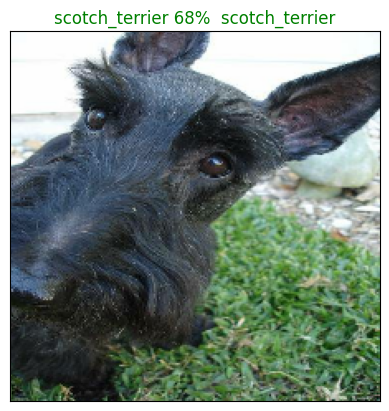

In [ ]:
plot_pred(predicitons, labels=val_label,images=val_image,n=1)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # finr the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # change the colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

In [ ]:
def plot_pred_conf(prediction_probabilities, labels,  n=1):
    """
    Plots the top 10 highest prediction confidences along with the true label for sample n.
    """
    pred_prob = prediction_probabilities[n]

    # Convert one-hot encoded `true_label` to class index
    true_label = np.argmax(labels[n])  # This assumes `labels` is one-hot encoded

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation='vertical')

    # Change the color of the bar corresponding to the true label
    true_label_name = unique_breeds[true_label]  # Convert class index to label name
    if true_label_name in top_10_pred_labels:
        true_label_index = np.where(top_10_pred_labels == true_label_name)[0][0]
        top_plot[true_label_index].set_color('green')

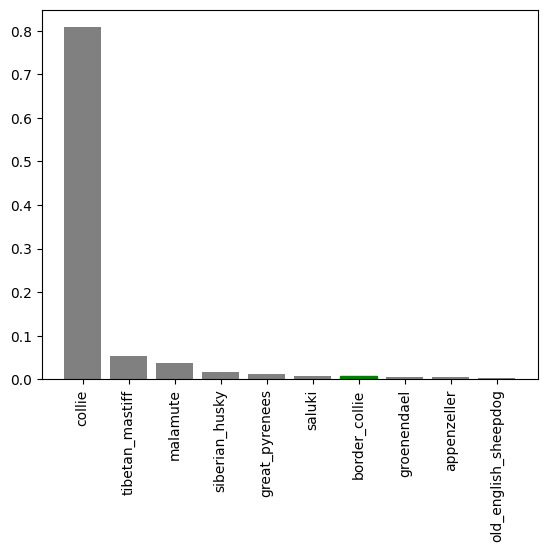

In [ ]:
plot_pred_conf(prediction_probabilities=predicitons,
               labels=val_labels,
               n=9)

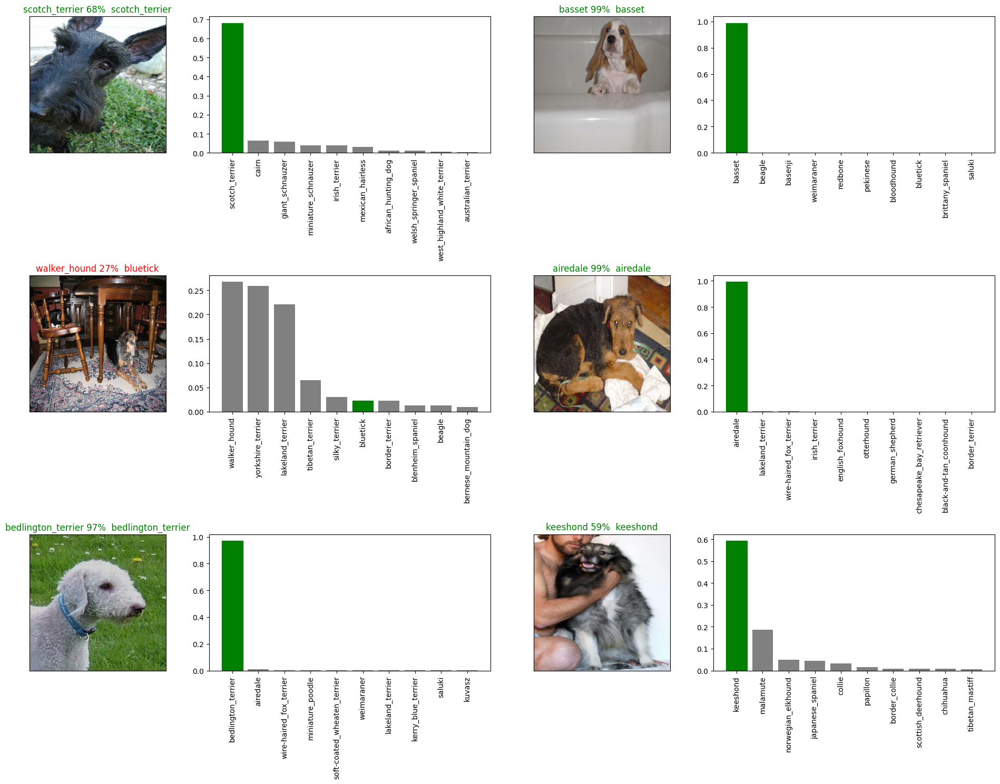

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier= 1
num_rows= 3
num_cols= 2
num_images= num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i +1)
  plot_pred(predicitons, labels=val_label,images=val_image,n=i + i_multiplier)

  plt.subplot(num_rows,2*num_cols , 2*i+2)
  plot_pred_conf(prediction_probabilities=predicitons,
                 labels=val_labels,
                 n= i+i_multiplier
                 )

  plt.tight_layout(h_pad=2)

plt.show()

In [ ]:
os.mkdir('/content/dogify/models')

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models dir
  and append a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir= os.path.join("/content/dogify/models/",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path= modeldir + "-"+ suffix + ".keras"
  print(f"saving  model to : {model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

saving  model to : /content/dogify/models/20241202-111929-1000-images-mobilenetv2-Adam.keras....


'/content/dogify/models/20241202-111929-1000-images-mobilenetv2-Adam.keras'

In [ ]:
# Load a trained model
path="/content/dogify/models/20241202-111929-1000-images-mobilenetv2-Adam.keras"
loaded_1000_image_model=tfk.models.load_model(path,
                      custom_objects={"KerasLayer":hub.KerasLayer},
                      )

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2226 - accuracy: 0.6900


[1.2226005792617798, 0.6899999976158142]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 17s 2s/step - loss: 1.2226 - accuracy: 0.6900


[1.2226005792617798, 0.6899999976158142]

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:


## Create a data batch with the full dataset
full_data= create_data_batches(x,y)



Creating data batche......


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callback
full_model_tensorboard= create_tensorboard_callback()
# No validation set when training on all the data, so we can't moitor validation accuracy
full_model_early_stopping= tf_keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
# Fit the full-model to the full data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping]
               )

Epoch 1/100
320/320 [==============================] - 642s 2s/step - loss: 1.3193 - accuracy: 0.6753
Epoch 2/100
320/320 [==============================] - 622s 2s/step - loss: 0.4003 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 644s 2s/step - loss: 0.2360 - accuracy: 0.9365
Epoch 4/100
320/320 [==============================] - 644s 2s/step - loss: 0.1532 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 673s 2s/step - loss: 0.1053 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 674s 2s/step - loss: 0.0774 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 674s 2s/step - loss: 0.0571 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 685s 2s/step - loss: 0.0460 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 653s 2s/step - loss: 0.0383 - accuracy: 0.9950
Epoch 10/100
320/320 [==============================] - 655s 2s/step - loss: 0.031

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

saving  model to : /content/dogify/models/20241202-150537-full-image-set-mobilenetv2-Adam.keras....


'/content/dogify/models/20241202-150537-full-image-set-mobilenetv2-Adam.keras'

In [ ]:
path = "/content/dogify/models/20241202-150537-full-image-set-mobilenetv2-Adam.keras"
loaded_full_model=tfk.models.load_model(path,
                      custom_objects={"KerasLayer":hub.KerasLayer},
                      )

In [ ]:
# Load test image filenames
test_path='/content/test/'
test_filename= [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['/content/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 '/content/test/7520c13b27768c999174118005523be9.jpg',
 '/content/test/5d29997e993eb603d9b07d68e9fd9b91.jpg',
 '/content/test/4e4572c19d7d137c63ea81ff197b3996.jpg',
 '/content/test/6e9173e742c6a980d48945c9839f69f4.jpg',
 '/content/test/0708b9e0cb58e97f01afc9033482f88a.jpg',
 '/content/test/d37849fa76cb8461fe805c8462993337.jpg',
 '/content/test/655235384db2545fefab8c75802a540f.jpg',
 '/content/test/81244aa081695af49058d6b1db5ee718.jpg',
 '/content/test/578b99743dbed43b2eab02fe4e437779.jpg']

In [ ]:
# Create test data batch
test_data= create_data_batches(test_filename,test_data=True)

Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions= loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 739s 2s/step


In [ ]:
!pip install pillow

In [178]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

def predict_image(image_path, model):
    """
    This function takes an image path and a trained model,
    preprocesses the image, makes a prediction, and returns the predicted breed label.
    """
    # Step 1: Process the image
    image = process_image(image_path)  # preprocess the image

    # Removed the extra dimension added here.
    image = tf.expand_dims(image, axis=0)

    # Step 3: Make a prediction
    predictions = loaded_full_model.predict(image)

    # Step 4: Get the predicted breed
    predicted_index = np.argmax(predictions)
    predicted_breed = unique_breeds[predicted_index]

    # Display the image and predicted label
    # img = plt.imread(image_path)
    # plt.imshow(img)
    # plt.axis('off')
    # plt.title(f"Predicted breed: {predicted_breed} with {np.max(predictions)*100:.2f}% confidence")
    # plt.show()

    return predicted_breed

# Example usage:
image_path = "/test_images/istockphoto-1396454958-612x612.jpg"  # Replace with the actual image path
predicted_breed = predict_image(image_path, loaded_full_model)

predicted_breed

1/1 [==============================] - 0s 78ms/step


'golden_retriever'

In [ ]:
#Trying to get an image from internet

